In [140]:
# forked from
# https://www.kaggle.com/davids1992/speech-representation-and-data-exploration

In [16]:
import os
import numpy as np
import pandas as pd
from scipy.fftpack import fft
from scipy import signal
from scipy.io import wavfile
from sklearn.decomposition import PCA

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import IPython.display as ipd
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import librosa
from librosa.display import specshow

import warnings
warnings.filterwarnings("ignore")

path = "F:/Code projects/Python/Match/TensorFlow Speech Recognition Challenge/"

# 1.Visualization

## 1.1 Wave and spectrogramm

In [58]:
train_audio_path = os.path.join(path + "train/audio")
filename = "yes/0a7c2a8d_nohash_0.wav"
sample_rate, samples = wavfile.read(os.path.join(train_audio_path, filename))
print(sample_rate)
print(samples)  # 16000

16000
[ 14  -7 -14 ...  19  20  27]


Define a function that calculates spectrogram.

Note, that we are taking logarithm of spectrogram values. It will make our plot much more clear, moreover, it is strictly connected to the way people hear. We need to assure that there are no 0 values as input to logarithm.

In [42]:
def log_specgram(audio, sample_rate, window_size=20, step_size=10, eps=1e-10):
    nperseg = int(round(window_size * sample_rate) / 1e3)
    noverlap = int(round(step_size * sample_rate) / 1e3)
    freqs, times, spec = signal.spectrogram(audio, fs=sample_rate, window="hann", 
                                            nperseg=nperseg, noverlap=noverlap, detrend=False)
    return freqs, times, np.log(spec.T.astype(np.float32) + eps)

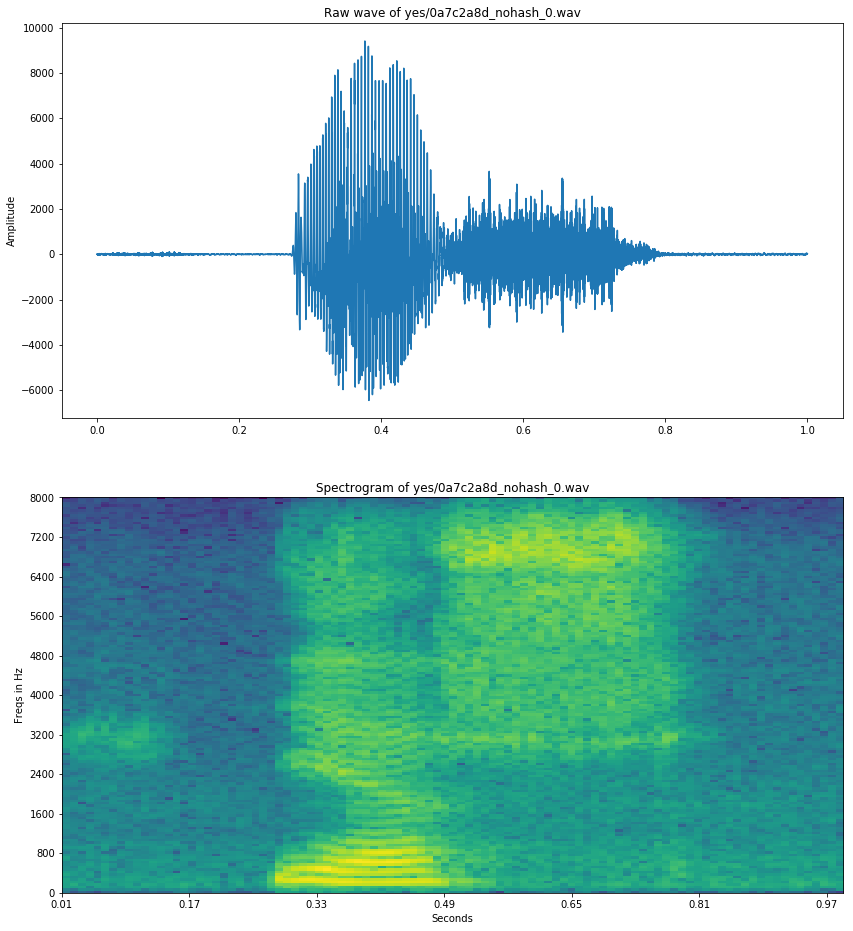

In [43]:
freqs, times, spectrogram = log_specgram(samples, sample_rate)  # spectrogram.shape: (99, 161)

fig, axes = plt.subplots(figsize=(14, 16), ncols=1, nrows=2)

ax = axes[0]
ax.set_title("Raw wave of " + filename)
ax.set_ylabel("Amplitude")  # 振幅
ax.plot(np.linspace(0, sample_rate / len(samples), sample_rate), samples)

ax = axes[1]
ax.imshow(spectrogram.T, aspect="auto", origin="lower", 
          extent=[times.min(), times.max(), freqs.min(), freqs.max()])
ax.set_yticks(freqs[::16])
ax.set_xticks(times[::16])
ax.set_title("Spectrogram of " + filename)
ax.set_ylabel("Freqs in Hz")
ax.set_xlabel("Seconds")

fig.show()

If we use spectrogram as an input features for NN, we have to remember to normalize features. (We need to normalize over all the dataset, here's example just for one, which doesn't give good mean and std!)

In [44]:
normalized_spectrogram = (spectrogram - np.mean(spectrogram, axis=0)) / np.std(spectrogram, axis=0)
print(normalized_spectrogram.shape)

(99, 161)


## 1.2 MFCC

If you want to get to know some details about MFCC take a look at this great tutorial. [MFCC explained](http://practicalcryptography.com/miscellaneous/machine-learning/guide-mel-frequency-cepstral-coefficients-mfccs/) You can see, that it is well prepared to imitate human hearing properties.

In [45]:
S = librosa.feature.melspectrogram(y=samples.astype(np.float32), sr=sample_rate, n_mels=128)

# Convert to log scale (dB). We'll use the peak power (max) as reference.
log_S = librosa.power_to_db(S, ref=np.max)

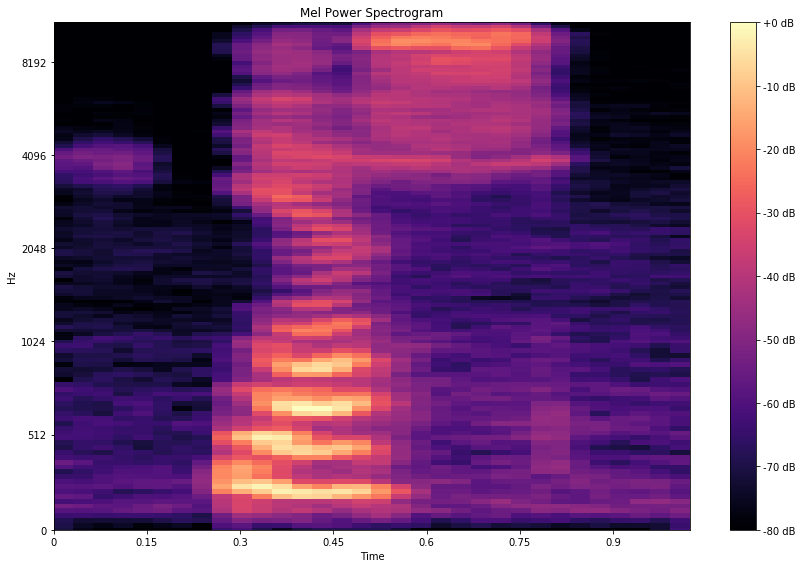

In [46]:
plt.figure(figsize=(12, 8))
specshow(data=log_S, sr=sample_rate, x_axis="time", y_axis="mel")
plt.title("Mel Power Spectrogram")
plt.colorbar(format="%+2.0f dB")
plt.tight_layout()
plt.show()

In [47]:
mfcc = librosa.feature.mfcc(S=log_S, n_mfcc=13)  # array shape (13, 32)

In [48]:
# Let's pad on the first and second deltas while we're at it
delta_mfcc = librosa.feature.delta(data=mfcc, order=2)  # array shape (13, 32)

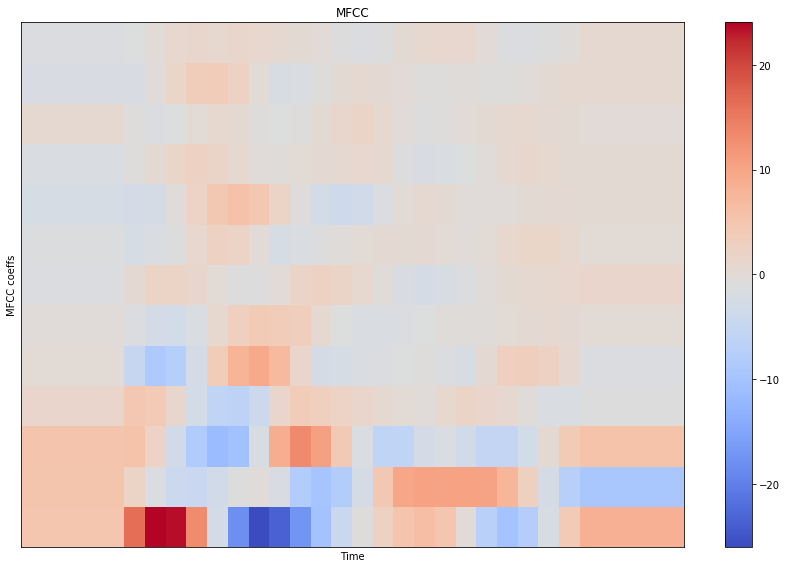

In [49]:
plt.figure(figsize=(12, 8))
specshow(data=delta_mfcc)
plt.ylabel("MFCC coeffs")
plt.xlabel("Time")
plt.title("MFCC")
plt.colorbar()
plt.tight_layout()
plt.show()

In classical, but still state-of-the-art systems, MFCC or similar features are taken as the input to the system instead of spectrograms.

However, in end-to-end (often neural-network based) systems, the most common input features are probably raw spectrograms, or mel power spectrograms. For example MFCC decorrelates features, but NNs deal with correlated features well. Also, if you'll understand mel filters, you may consider their usage sensible.

It is your decision which to choose!

## 1.3 Spectrogram in 3d

In [50]:
data = [go.Surface(z=spectrogram.T)]
layout = go.Layout(
    title='Specgtrogram of "yes" in 3d',
    scene = dict(
        yaxis = dict(title='Frequencies', range=[0, 200]),
        xaxis = dict(title='Time', range=[0, 100]),
        zaxis = dict(title='Log amplitude'),
    ),
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

## 1.4 Silence removal

In [51]:
ipd.Audio(samples, rate=sample_rate)  # samples length: 16000

I consider that some VAD (Voice Activity Detection) will be really useful here. Although the words are short, there is a lot of silence in them. A decent VAD can reduce training size a lot, accelerating training speed significantly. Let's cut a bit of the file from the beginning and from the end. and listen to it again (based on a plot above, we take from 4000 to 13000):

In [52]:
samples_cut = samples[4000: 13000]  # samples length: 9000 Reduce a lot but can still hear 'yes' clearly
ipd.Audio(samples_cut, rate=sample_rate)

We can agree that the entire word can be heard. It is impossible to cut all the files manually and do this basing on the simple plot. But you can use for example webrtcvad package to have a good VAD.

Let's plot it again, together with guessed alignment of 'y' 'e' 's' graphems

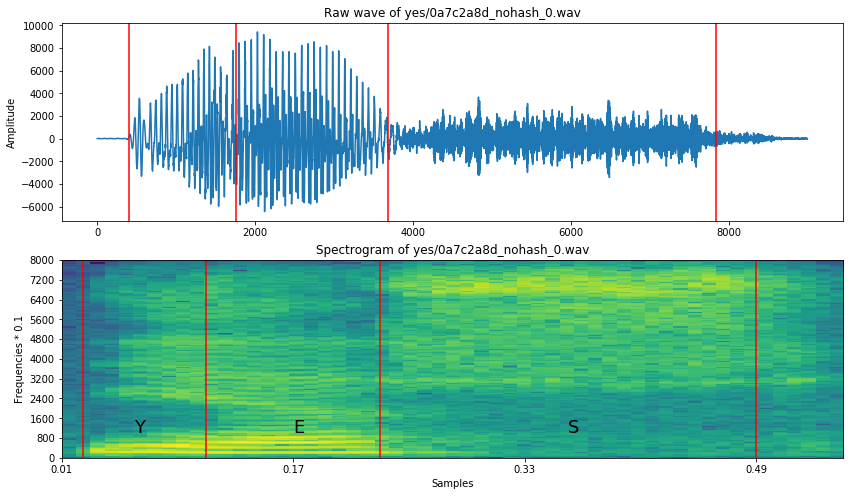

In [55]:
freqs, times, spectrogram_cut = log_specgram(samples_cut, sample_rate)

fig = plt.figure(figsize=(14, 8))

ax1 = fig.add_subplot(211)
ax1.set_title('Raw wave of ' + filename)
ax1.set_ylabel('Amplitude')
ax1.plot(samples_cut)

ax2 = fig.add_subplot(212)
ax2.set_title('Spectrogram of ' + filename)
ax2.set_ylabel('Frequencies * 0.1')
ax2.set_xlabel('Samples')
ax2.imshow(spectrogram_cut.T, aspect='auto', origin='lower', 
           extent=[times.min(), times.max(), freqs.min(), freqs.max()])
ax2.set_yticks(freqs[::16])
ax2.set_xticks(times[::16])

ax2.text(x=0.06, y=1000, s='Y', fontsize=18)
ax2.text(x=0.17, y=1000, s='E', fontsize=18)
ax2.text(x=0.36, y=1000, s='S', fontsize=18)

xcoords = [0.025, 0.11, 0.23, 0.49]
for xc in xcoords:
    ax1.axvline(x=xc*16000, c='red')
    ax2.axvline(x=xc, c='red')

fig.show()

## 1.5. Resampling - dimensionality reduction

Another way to reduce the dimensionality of our data is to resample recordings.

You can hear that the recording don't sound very natural, because they are sampled with 16k frequency, and we usually hear much more. However, [the most speech related frequencies are presented in smaller band](https://en.wikipedia.org/wiki/Voice_frequency). That's why you can still understand another person talking to the telephone, where GSM signal is sampled to 8000 Hz.

Summarizing, we could resample our dataset to 8k. We will discard some information that shouldn't be important, and we'll reduce size of the data.

We have to remember that it can be risky, because this is a competition, and sometimes very small difference in performance wins, so we don't want to lost anything. On the other hand, first experiments can be done much faster with smaller training size.

We'll need to calculate FFT (Fast Fourier Transform). Definition:

Let's read some recording, resample it, and listen. We can also compare FFT, Notice, that there is almost no information above 4000 Hz in original signal.

In [66]:
filename = 'happy/0b09edd3_nohash_0.wav'
new_sample_rate = 8000
sample_rate, samples = wavfile.read(os.path.join(train_audio_path, filename))  # sample_rate = 16000
resampled = signal.resample(samples, num=int(new_sample_rate / sample_rate * len(samples)))  # [8000, ]

In [69]:
ipd.Audio(samples, rate=sample_rate)

In [70]:
ipd.Audio(resampled, rate=new_sample_rate)  # Almost no difference!

In [ ]:
def custom_fft(y, fs):
    """
    :param y: 时域信号
    :param fs: 采样率
    return: 频率
    """
    T = 1.0 / fs
    N = len(y)
    yf = fft(y)  # complex dtype -> frequency domain
    
    # FFT is simmetrical, so we take just the first half
    # FFT is also complex, so we take the complex mod 
    vals = 2.0 / N * np.abs(yf[: N // 2])
    xf = np.linspace(0.0, 1.0 / (2.0 * T), len(vals))  # freqs
    return xf, vals    

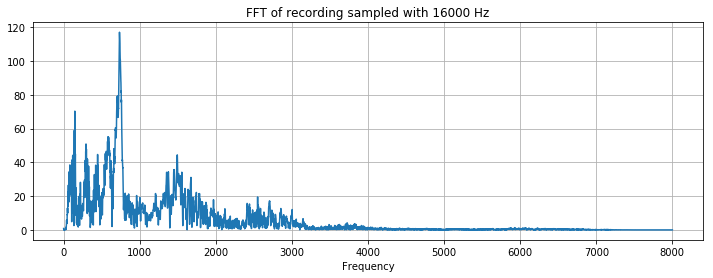

In [106]:
xf, vals = custom_fft(samples, sample_rate)
plt.figure(figsize=(12, 4))
plt.title('FFT of recording sampled with ' + str(sample_rate) + ' Hz')
plt.plot(xf, vals)
plt.xlabel('Frequency')
plt.grid()
plt.show()

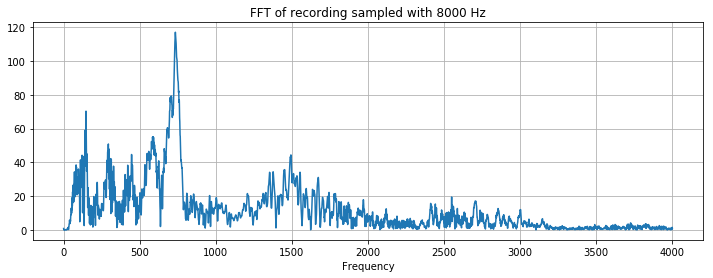

In [104]:
xf, vals = custom_fft(resampled, new_sample_rate)
plt.figure(figsize=(12, 4))
plt.title('FFT of recording sampled with ' + str(new_sample_rate) + ' Hz')
plt.plot(xf, vals)
plt.xlabel('Frequency')
plt.grid()
plt.show()

## 1.6 Features extraction steps

I would propose the feature extraction algorithm like that:
1. Resampling
2. *VAD*
3. Maybe padding with 0 to make signals be equal length
4. Log spectrogram (or *MFCC*, or *PLP*)
5. Features normalization with *mean* and *std*
6. Stacking of a given number of frames to get temporal information

It's a pity it can't be done in notebook. It has not much sense to write things from zero, and everything is ready to take, but in packages, that can not be imported in Kernels.

# 2. Dataset investigation

Some usuall investgation of dataset.

## 2.1. Number of records

In [111]:
dirs = [f for f in os.listdir(train_audio_path) if os.path.isdir(os.path.join(train_audio_path, f))]
dirs.sort()
print('Number of labels: ' + str(len(dirs)))

Number of labels: 31


In [112]:
# Summary
number_of_recordings = {}
for label in dirs:
    label_path = os.path.join(train_audio_path, label)
    wavs = [file for file in os.listdir(label_path) if file.endswith(".wav")]
    number_of_recordings[label] = len(wavs)

In [114]:
labels, nums = list(number_of_recordings.keys()), list(number_of_recordings.values())

In [128]:
# Plot
"""
possible colorscale
'Greys', 'YlGnBu', 'Greens', 'YlOrRd', 'Bluered', 'RdBu',
'Reds', 'Blues', 'Picnic', 'Rainbow', 'Portland', 'Jet',
'Hot', 'Blackbody', 'Earth', 'Electric', 'Viridis', 'Cividis'
"""
data = [go.Bar(x=labels, y=nums, marker = dict(color = nums, colorscale = "RdBu", showscale = True))]

layout = go.Layout(
    title = "Number of recordings in given label",
    xaxis = dict(title = "labels"),
    yaxis = dict(title = "Number of Recordings", range=[0, 2400])
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

Dataset is balanced except of background_noise, but that's the different thing.

## 2.2 Deeper into recordings

There's a very important fact. Recordings come from very different sources. As far as I can tell, some of them can come from mobile GSM channel.

Nevertheless, **it is extremely important to split the dataset in a way that one speaker doesn't occur in both train and test sets.** Just take a look and listen to this two examlpes:

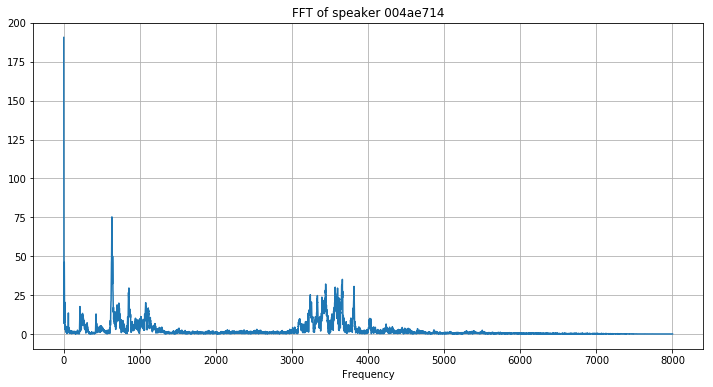

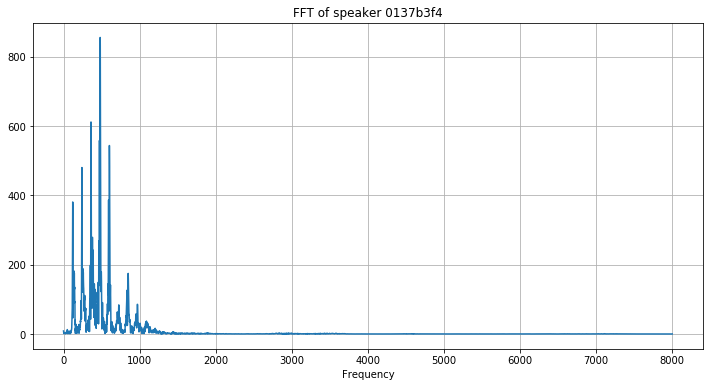

In [131]:
filenames = ['on/004ae714_nohash_0.wav', 'on/0137b3f4_nohash_0.wav']
for filename in filenames:
    speaker = filename.split("/")[-1].split("_")[0]
    sample_rate, samples = wavfile.read(os.path.join(train_audio_path, filename))
    xf, vals = custom_fft(samples, sample_rate)
    plt.figure(figsize=(12, 6))
    plt.title("FFT of speaker %s" % speaker)
    plt.plot(xf, vals)
    plt.xlabel("Frequency")
    plt.grid()
    plt.show()

Even better to listen:

In [133]:
filename = filenames[0]
speaker = filename.split("/")[-1].split("_")[0]
print("Speaker: %s" % speaker)
ipd.Audio(os.path.join(train_audio_path, filename))

Speaker: 004ae714


In [134]:
filename = filenames[1]
speaker = filename.split("/")[-1].split("_")[0]
print("Speaker: %s" % speaker)
ipd.Audio(os.path.join(train_audio_path, filename))

Speaker: 0137b3f4


There are also recordings with some weird silence (some compression?):

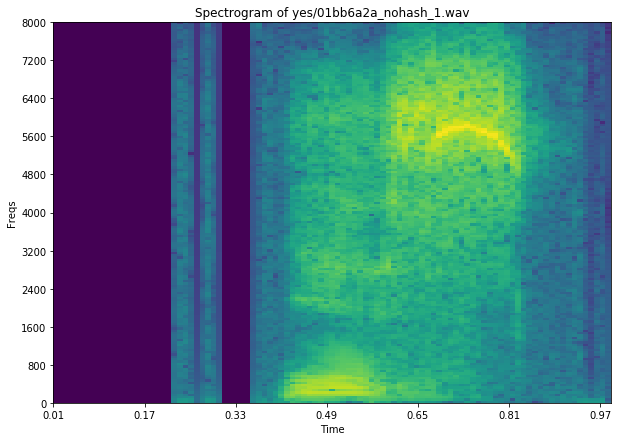

In [135]:
filename = 'yes/01bb6a2a_nohash_1.wav'
sample_rate, samples = wavfile.read(os.path.join(train_audio_path, filename))
freqs, times, spectrogram = log_specgram(samples, sample_rate)

plt.figure(figsize=(10, 7))
plt.title('Spectrogram of ' + filename)
plt.ylabel('Freqs')
plt.xlabel('Time')
plt.imshow(spectrogram.T, aspect='auto', origin='lower', 
           extent=[times.min(), times.max(), freqs.min(), freqs.max()])
plt.yticks(freqs[::16])
plt.xticks(times[::16])
plt.show()

In [136]:
ipd.Audio(os.path.join(train_audio_path, filename))

It means, that we have to prevent overfitting to the very specific acoustical environments.

## 2.3. Recordings length
Find if all the files have 1 second duration:

In [141]:
recording_length_summary = []
for label in dirs:
    label_path = os.path.join(train_audio_path, label)
    waves = [f for f in os.listdir(label_path) if f.endswith(".wav")]
    for wav in waves:
        sample_rate, samples = wavfile.read(os.path.join(label_path, wav))
        recording_length_summary.append(len(samples) / sample_rate)

In [143]:
print(len([x for x in recording_length_summary if x < 1]))

6469


Quite a lot files shorter than 1 second. We can pad them with zero.

## 2.4 Mean spectrograms and FFT
plot mean FFT for every word

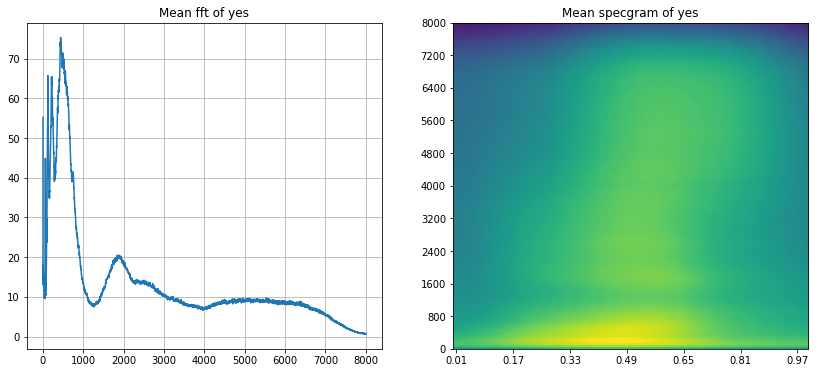

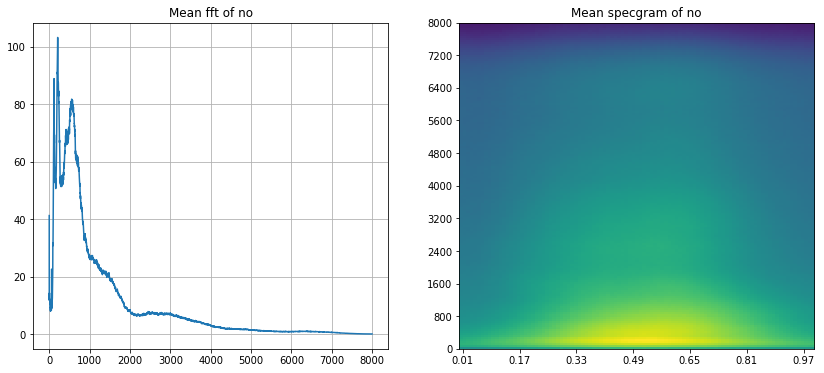

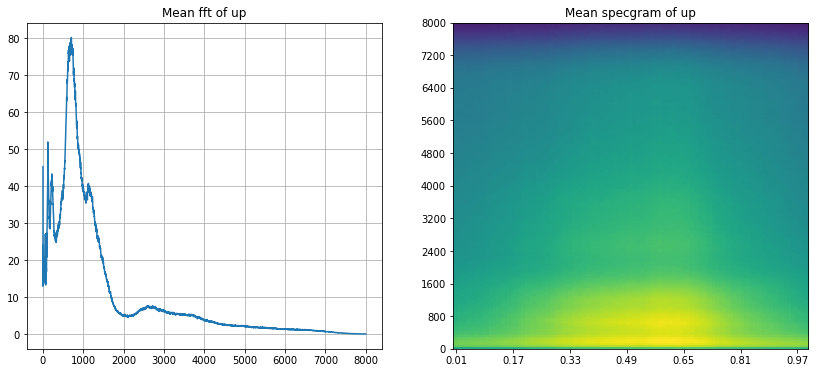

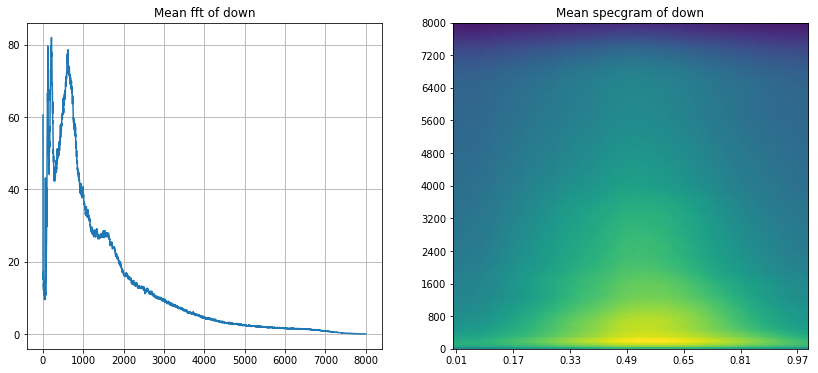

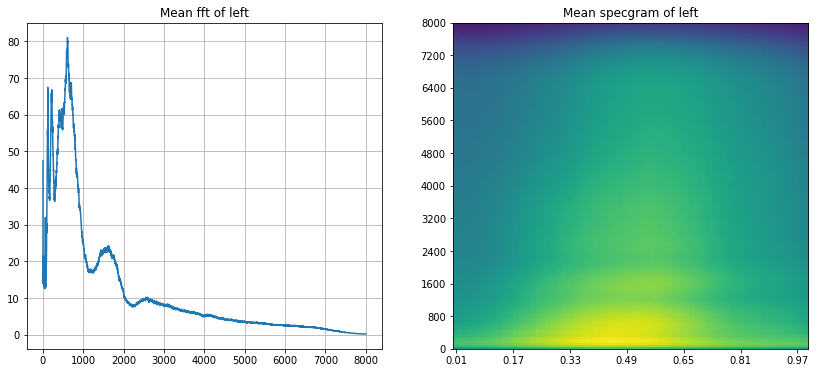

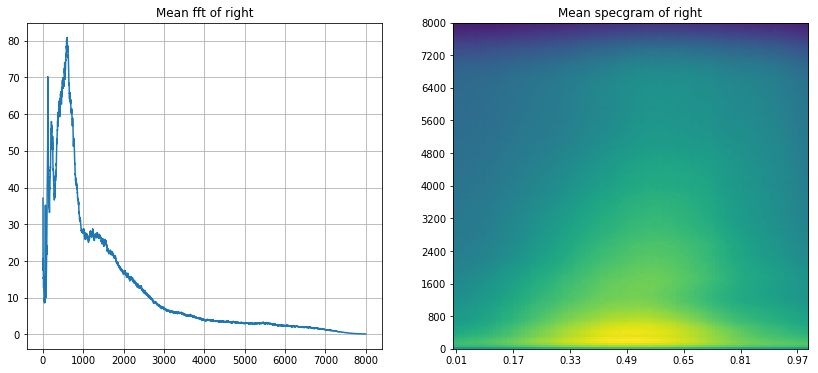

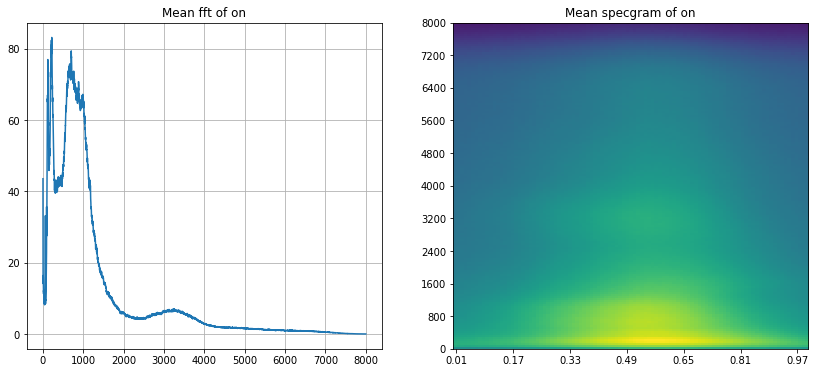

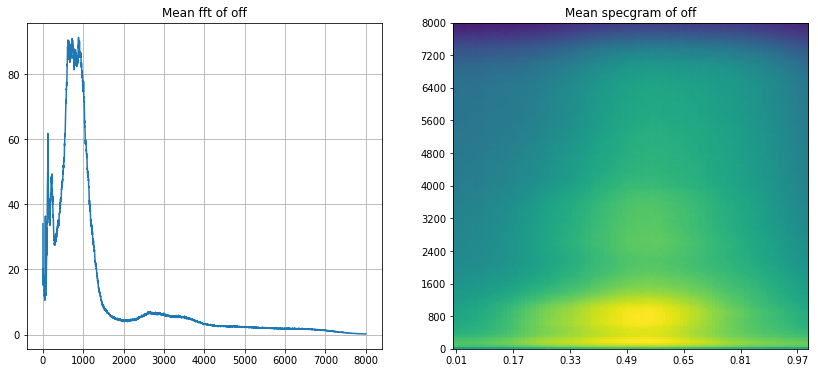

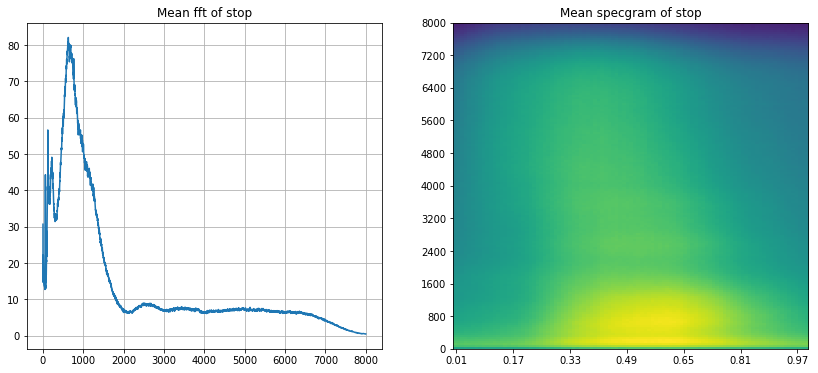

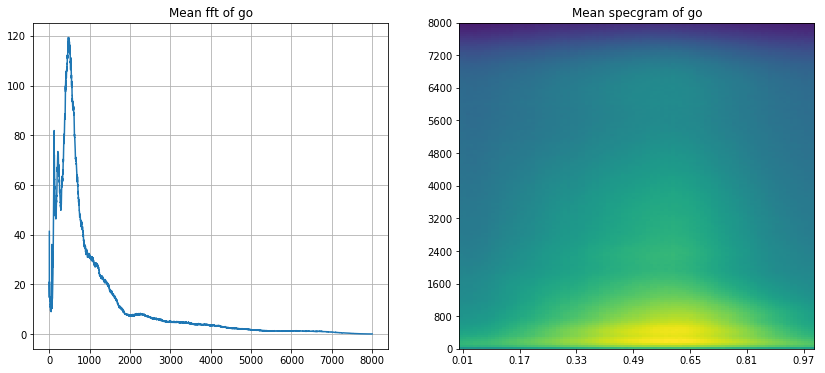

In [150]:
to_keep = 'yes no up down left right on off stop go'.split()  # just summary on these labels

for label in to_keep:
    vals_all = []
    spec_all = []
    label_path = os.path.join(train_audio_path, label)
    for wav in os.listdir(label_path):
        if not wav.endswith(".wav"):
            continue
        sample_rate, samples = wavfile.read(os.path.join(label_path, wav))
        if len(samples) != 16000:
            continue
        xf, vals = custom_fft(samples, 16000)
        vals_all.append(vals)
        freqs, times, spec = log_specgram(samples, 16000)
        spec_all.append(spec)
    
    vals_all = np.array(vals_all)
    spec_all = np.array(spec_all)
    
    fig, axes = plt.subplots(figsize=(14, 6), ncols=2, nrows=1)
    ax1, ax2 = axes
    ax1.set_title("Mean fft of %s" % label)
    ax1.plot(np.mean(vals_all, axis=0))
    ax1.grid()
    
    ax2.set_title("Mean specgram of %s" % label)
    ax2.imshow(np.mean(spec_all, axis=0).T, aspect="auto", origin="lower", 
               extent=[0, 1, 0, 8000])
    ax2.set_yticks(freqs[::16])
    ax2.set_xticks(times[::16])
    fig.show()

## 2.5 Gaussian Mixtures Modeling
We can see that mean FFT looks different for every word. We could model each FFT with a mixture of Gaussian distributions. Some of them however, look almost identical on FFT, like stop and up... But wait, they are still distinguishable when we look at spectrograms! High frequencies are earlier than low at the beginning of stop (probably s).

That's why temporal component is also necessary. There is a [Kaldi](http://kaldi-asr.org/) library, that can model words (or smaller parts of words) with GMMs and model temporal dependencies with Hidden Markov Models.

We could use simple GMMs for words to check what can we model and how hard it is to distinguish the words. We can use Scikit-learn for that, however it is not straightforward and lasts very long here, so I abandon this idea for now.

## 2.6. Frequency components across the words

In [152]:
freqs

array([   0.,   50.,  100.,  150.,  200.,  250.,  300.,  350.,  400.,
        450.,  500.,  550.,  600.,  650.,  700.,  750.,  800.,  850.,
        900.,  950., 1000., 1050., 1100., 1150., 1200., 1250., 1300.,
       1350., 1400., 1450., 1500., 1550., 1600., 1650., 1700., 1750.,
       1800., 1850., 1900., 1950., 2000., 2050., 2100., 2150., 2200.,
       2250., 2300., 2350., 2400., 2450., 2500., 2550., 2600., 2650.,
       2700., 2750., 2800., 2850., 2900., 2950., 3000., 3050., 3100.,
       3150., 3200., 3250., 3300., 3350., 3400., 3450., 3500., 3550.,
       3600., 3650., 3700., 3750., 3800., 3850., 3900., 3950., 4000.,
       4050., 4100., 4150., 4200., 4250., 4300., 4350., 4400., 4450.,
       4500., 4550., 4600., 4650., 4700., 4750., 4800., 4850., 4900.,
       4950., 5000., 5050., 5100., 5150., 5200., 5250., 5300., 5350.,
       5400., 5450., 5500., 5550., 5600., 5650., 5700., 5750., 5800.,
       5850., 5900., 5950., 6000., 6050., 6100., 6150., 6200., 6250.,
       6300., 6350.,

In [206]:
def violinplot_freq(labels, freq_ind):
    """ 
    Plot violinplots for given labels (waves in dirs) and frequency freq_ind
    :param labels: target labels to plot
    :param freq_ind: target freq_index to evaluate
    :return: None, show plot
    """
    spec_all = []
    ind = 0
    FREQS = np.arange(0, 8050, 50)
    for label in labels:
        specs = []
        label_path = os.path.join(train_audio_path, label)
        wavs = [f for f in os.listdir(label_path) if f.endswith(".wav")]
        for wav in wavs[: 100]:
            sample_rate, samples = wavfile.read(os.path.join(label_path, wav))
            freqs, times, spec = log_specgram(samples, sample_rate)
            if freqs is None:
                freqs = freqs
            specs.extend(spec[:, freq_ind])
        spec_all.append(specs)
    # Different lengths = different num of frames. Make number equal
    minimum = min([len(spec) for spec in spec_all])
    spec_all = np.array([spec[: minimum] for spec in spec_all])
    
    plt.figure(figsize=(15, 7))
    plt.title("Frequency %d Hz" % FREQS[freq_ind])
    plt.ylabel("Amount of Frequency in label")
    plt.xlabel("Lables")
    sns.violinplot(data=pd.DataFrame(spec_all.T, columns=labels))
    plt.show()            

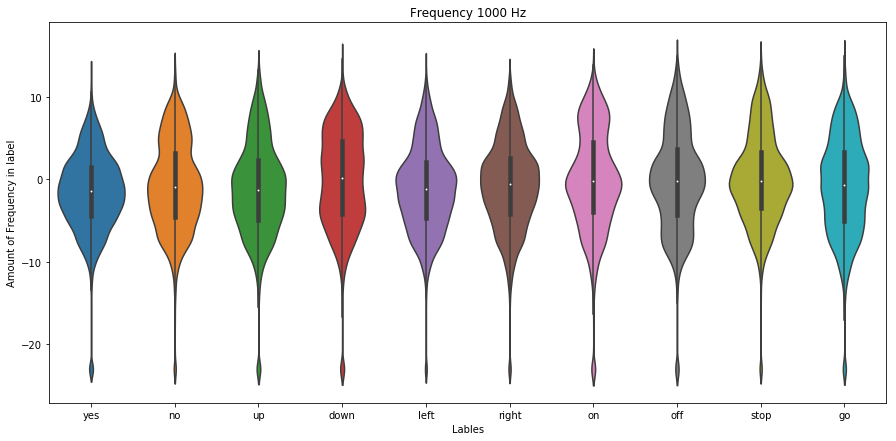

In [207]:
violinplot_freq(to_keep, 20)  # 1000 Hz

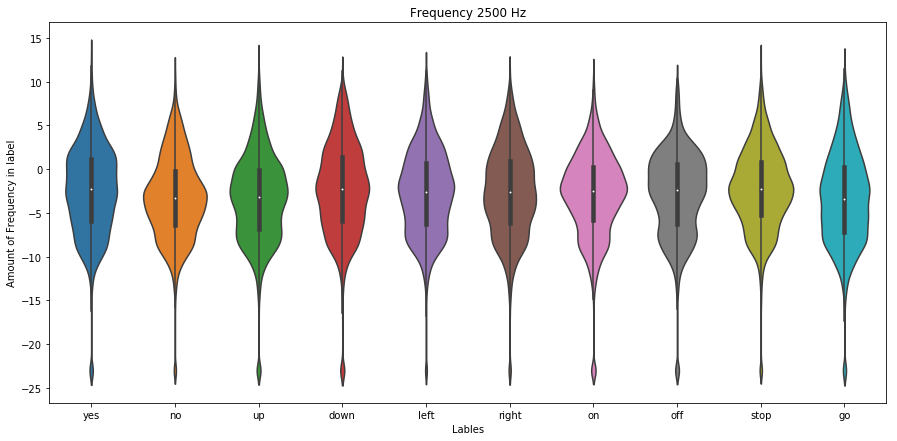

In [208]:
violinplot_freq(to_keep, 50)  # 2500 Hz

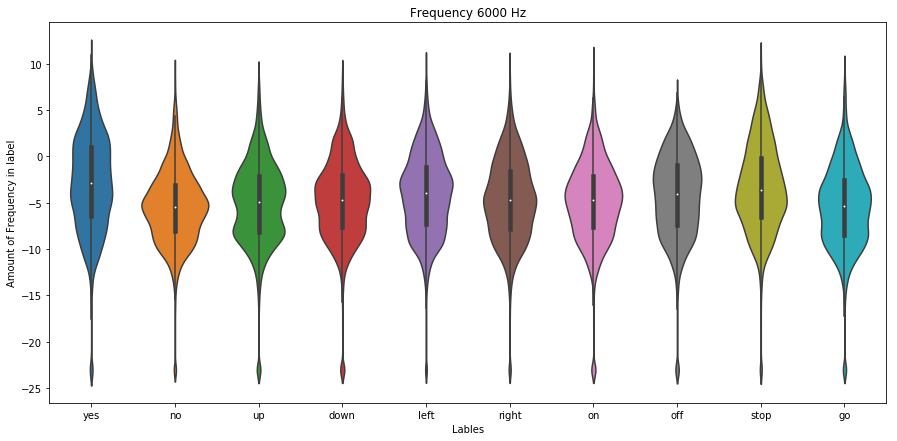

In [210]:
violinplot_freq(to_keep, 120)  # 6000 Hz

## 2.7 Anomaly detection
We should check if there are any recordings that somehow stand out from the rest. We can lower the dimensionality of the dataset and interactively check for any anomaly. We'll use PCA for dimensionality reduction:

In [211]:
fft_all = []
names = []
for label in to_keep:
    label_path = os.path.join(train_audio_path, label)
    for wav in os.listdir(label_path):
        if not wav.endswith(".wav"):
            continue
        sample_rate, samples = wavfile.read(os.path.join(label_path, wav))
        if len(samples) < sample_rate:
            samples = np.append(samples, np.zeros(sample_rate - len(samples)))
        x, val = custom_fft(samples, sample_rate)
        fft_all.append(val)
        names.append(label + "/" + wav)
fft_all = np.array(fft_all)

# normalization
fft_all = (fft_all - np.mean(fft_all, axis=0)) / np.std(fft_all, axis=0)

# dim reduction to plot
pca = PCA(n_components=3)
fft_all = pca.fit_transform(fft_all)

scatt = go.Scatter3d(x=fft_all[:, 0], y=fft_all[:, 1], z=fft_all[:, 2], mode="markers", text=names)
layout = go.Layout(title="Anomaly Detection")
fig = go.Figure(data=[scatt], layout=layout)
py.iplot(fig)        

Notice that there are *yes/e4b02540_nohash_0.wav*, *yes/5165cf0a_nohash_0.wav* and more points, that lie far away from the rest. Let's listen to them.

In [212]:
print('Recording yes/e4b02540_nohash_0.wav')
ipd.Audio(os.path.join(train_audio_path, 'yes/e4b02540_nohash_0.wav'))

Recording yes/e4b02540_nohash_0.wav


In [213]:
print('Recording yes/5165cf0a_nohash_0.wav')
ipd.Audio(os.path.join(train_audio_path, 'yes/5165cf0a_nohash_0.wav'))

Recording yes/5165cf0a_nohash_0.wav


# 3. Where to look for the inspiration

You can take many different approches for the competition. I can't really advice any of that. I'd like to share my initial thoughts.

There is a trend in recent years to propose solutions based on neural networks. Usually there are two architectures. My ideas are here.

1. Encoder-decoder: https://arxiv.org/abs/1508.01211
2. RNNs with CTC loss: https://arxiv.org/abs/1412.5567<br>
For me, 1 and 2  are a sensible choice for this competition, especially if you do not have background in SR field. They try to be end-to-end solutions. Speech recognition is a really big topic and it would be hard to get to know important things in short time.

3. Classic speech recognition is described here: http://www.ece.ucsb.edu/Faculty/Rabiner/ece259/Reprints/tutorial%20on%20hmm%20and%20applications.pdf

You can find *Kaldi* [Tutorial for dummies](http://kaldi-asr.org/doc/kaldi_for_dummies.html), with a problem similar to this competition in some way.

4. Very deep CNN - Don't know if it is used for SR. However, most papers concern Large Vocabulary Continuous Speech Recognition Systems (LVCSR). We got different task here - a very small vocabulary, and recordings with only one word in it, with a (mostly) given length. I suppose such approach can win the competition. 
